#### Importing Libraries


In [2]:
import numpy as np
import os
import open3d
import matplotlib.pyplot as plt
import cv2

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [3]:
data = {}

#### Computing the LIDAR Normals and Offsets

In [4]:
def lidar_normals_offsets(dir_path):
    lidar_plane_normals = []
    lidar_plane_offsets = []
    count = 0 
    for file in os.listdir(dir_path):
        if file.endswith(".pcd"):
            pcd = open3d.io.read_point_cloud(os.path.join(dir_path, file))
            file_name = file.split(".")[0]
            points_ = np.asarray(pcd.points)
            # center the points
            centroid = np.mean(points_, axis=0)
            points = points_ - centroid
            cov_matrix = np.cov(points, rowvar=False)
            U, S, Vt = np.linalg.svd(cov_matrix)
            normal = Vt[-1]
            normal = normal / np.linalg.norm(normal)
            offset = np.dot(normal, centroid)
            if (offset < 0):
                normal = -normal
                offset = -offset
            if (count < 25):
                lidar_plane_normals.append(normal)
                lidar_plane_offsets.append(offset)
            data[file_name] = []
            data[file_name].append(normal)
            data[file_name].append(offset)
            print(f"Normal: {normal}, Offset: {offset}")
        count += 1
    lidar_plane_normals = np.array(lidar_plane_normals)
    lidar_plane_offsets = np.array(lidar_plane_offsets)
    return lidar_plane_normals, lidar_plane_offsets

In [5]:
dir_path = './calibration/lidar_scans'
lidar_plane_normals, lidar_plane_offsets = lidar_normals_offsets(dir_path)

Normal: [ 0.63693437 -0.76499839  0.09535237], Offset: 4.993811298096004
Normal: [ 0.70169742 -0.70118932  0.1263102 ], Offset: 4.720779659728762
Normal: [ 0.93809241 -0.22958973  0.25936688], Offset: 5.204305546806318
Normal: [ 0.72352642 -0.68812782 -0.05467752], Offset: 4.79350162621247
Normal: [ 0.83333533 -0.55208241  0.02751785], Offset: 5.220803337324183
Normal: [ 0.91935323 -0.3607026   0.15710911], Offset: 5.702524575286329
Normal: [0.94151039 0.18949708 0.27865578], Offset: 6.323572215248568
Normal: [ 0.81878735  0.50763718 -0.26812639], Offset: 6.445439719171263
Normal: [ 0.93288206 -0.2440387   0.26490788], Offset: 5.6742584632412605
Normal: [ 0.95207118 -0.1539658   0.26430097], Offset: 5.743694294895789
Normal: [ 0.60407281 -0.77412903  0.18926246], Offset: 5.062352211986537
Normal: [ 0.75932657 -0.56254883  0.32705042], Offset: 4.954015451590529
Normal: [ 0.47346333 -0.7599202  -0.44536924], Offset: 5.2549842264287
Normal: [ 0.52528321 -0.84450165 -0.1043768 ], Offset: 6

In [6]:
lidar_plane_normals = lidar_plane_normals.T
lidar_plane_offsets = lidar_plane_offsets.reshape(25, 1)

#### Computing the Camera Normals and Offsets, and the Camera to LIDAR Transformation Matrix

In [7]:
alpha_c = []
theta_c = []
count = 0
for file in os.listdir('calibration/camera_images/'):
    if file.endswith(".jpeg"):
        img = cv2.imread(os.path.join('calibration/camera_images/', file))
        file_name = file.split(".")[0]
        rotation_vectors = []
        translation_vectors = []
        camera_normals = []
        rotation_matrix = []
        path = os.path.join('calibration/camera_parameters/', file + '/')
        with open(os.path.join(path, 'rotation_vectors.txt')) as f:
            for line in f:
                rotation_vectors.append(list(map(float, line.split())))
        with open(os.path.join(path, 'translation_vectors.txt')) as f:
            for line in f:
                translation_vectors.append(list(map(float, line.split())))
        with open(os.path.join(path, 'camera_normals.txt')) as f:
            for line in f:
                camera_normals.append(list(map(float, line.split())))
        with open(os.path.join(path, 'rotation_matrix.txt')) as f:  
            for line in f:
                rotation_matrix.append(list(map(float, line.split())))
        rotation_vectors = np.array(rotation_vectors)
        translation_vectors = np.array(translation_vectors)
        camera_normals = np.array(camera_normals)
        camera_normals = camera_normals / np.linalg.norm(camera_normals)
        rotation_matrix = np.array(rotation_matrix)
        offset = camera_normals.T @ translation_vectors
        if (offset < 0):
            offset = -offset
            camera_normals = -camera_normals
        data[file_name].append(camera_normals)
        data[file_name].append(offset)
        data[file_name].append(rotation_vectors)
        data[file_name].append(translation_vectors)
        data[file_name].append(rotation_matrix)
        if (count < 25):
            theta_c.append(camera_normals)
            alpha_c.append(offset)
    count += 1
theta_c = np.array(theta_c).reshape(25, 3).T
alpha_c = np.array(alpha_c).reshape(25, 1)
theta_l = lidar_plane_normals
alpha_l = lidar_plane_offsets

#### Stage 1 of the Algorithm: Computing the Rotation Matrix and Translation Vector

In [8]:
translation_t = np.linalg.inv(theta_c @ theta_c.T) @ theta_c @ (alpha_c - alpha_l)
matrix = theta_l @ theta_c.T    
U, S, Vt = np.linalg.svd(matrix)
V = Vt.T
rotation_t = V @ U.T
print("Determinant of rotation matrix: ", np.linalg.det(rotation_t))
print("Rotation matrix: \n", rotation_t)
print("Translation matrix: ", translation_t.T)

Determinant of rotation matrix:  0.9999999999999999
Rotation matrix: 
 [[-0.17934806 -0.98377389 -0.00481772]
 [ 0.01810312  0.00159606 -0.99983485]
 [ 0.98361911 -0.17940566  0.01752313]]
Translation matrix:  [[ 0.15017004 -0.41198374 -0.60030909]]


#### Transformation Matrix

In [9]:
transformation_matrix = np.zeros((4, 4))    
transformation_matrix[:3, :3] = rotation_t
transformation_matrix[:3, 3] = translation_t.T
transformation_matrix[3, 3] = 1
print("Transformation matrix: \n", transformation_matrix)

Transformation matrix: 
 [[-0.17934806 -0.98377389 -0.00481772  0.15017004]
 [ 0.01810312  0.00159606 -0.99983485 -0.41198374]
 [ 0.98361911 -0.17940566  0.01752313 -0.60030909]
 [ 0.          0.          0.          1.        ]]


#### Camera Intrinsic Matrix

In [10]:
# get the camera intrinsics and distortion coefficients
with open('calibration/camera_parameters/camera_intrinsic.txt') as f:
    camera_intrinsic = []
    for line in f:
        camera_intrinsic.append(list(map(float, line.split())))
camera_intrinsic = np.array(camera_intrinsic)
with open('calibration/camera_parameters/distortion.txt') as f:
    distortion_coefficients = []
    for line in f:
        distortion_coefficients.append(list(map(float, line.split())))
distortion_coefficients = np.array(distortion_coefficients)

#### Plotting the transformed LIDAR Point Clouds on the Camera Images

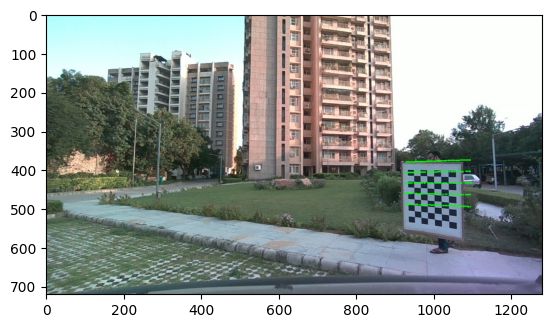

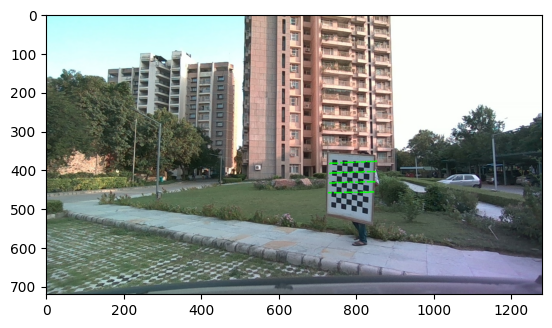

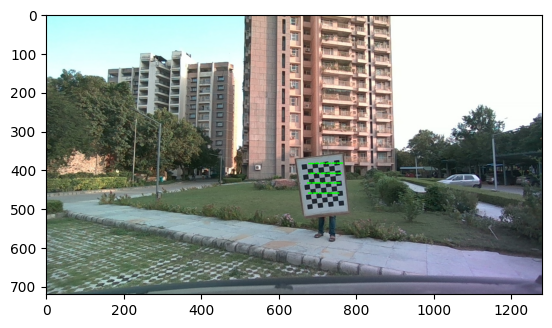

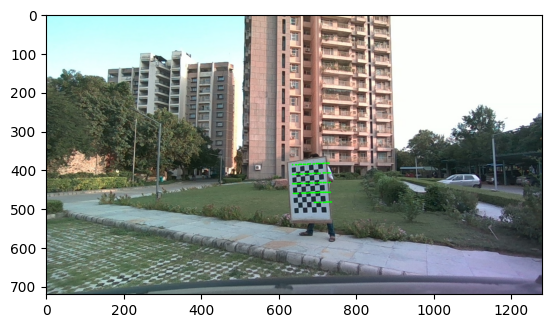

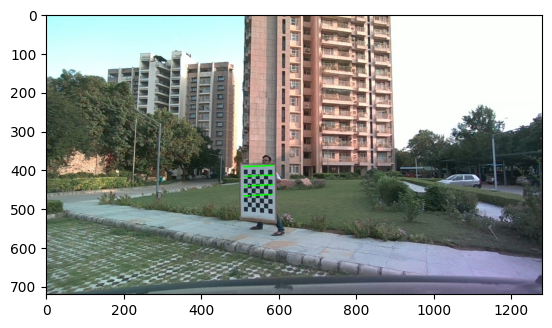

...

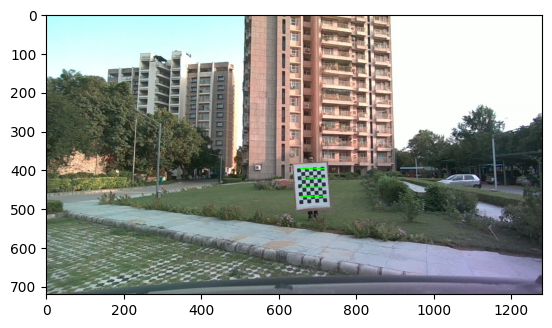

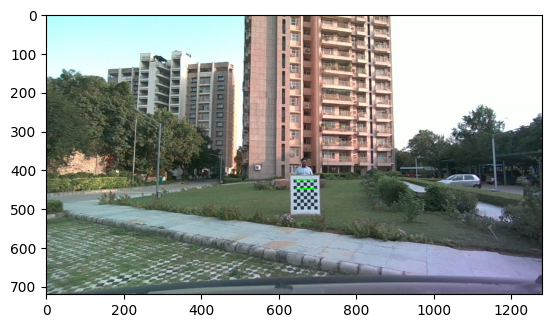

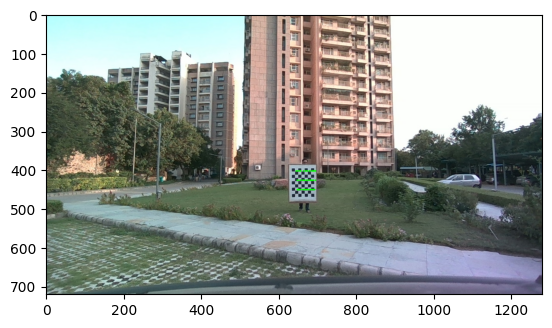

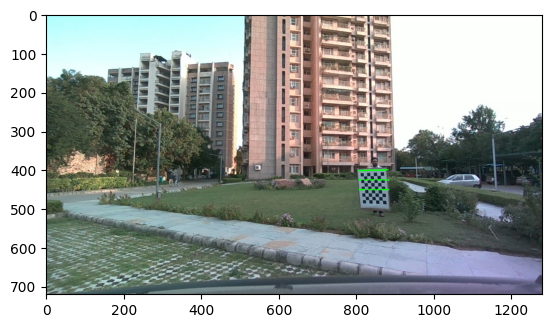

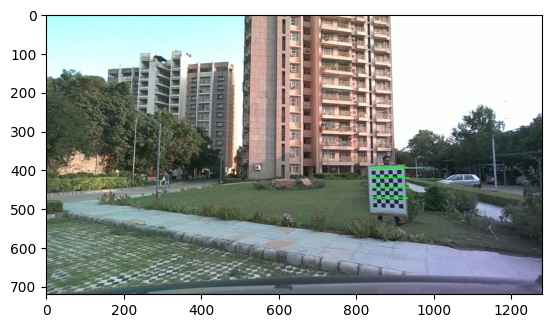

In [11]:
# fetch all the points and apply the transformation matrix
file_path = './calibration/lidar_scans/'
for file in os.listdir(file_path):
    if file.endswith(".pcd"):
        idx = file.split('_')[1].split('.')[0]
        pcd = open3d.io.read_point_cloud('./calibration/lidar_scans/frame_' + idx + '.pcd')
        points = np.asarray(pcd.points)
        points = np.hstack((points, np.ones((points.shape[0], 1))))
        points = np.dot(transformation_matrix, points.T).T
        points = points[:, :3]
        cam_points = np.dot(points, camera_intrinsic.T)
        cam_points = cam_points / cam_points[:, 2].reshape(-1, 1)
        cam_points = cam_points.astype(np.int32)
        img = cv2.imread('calibration/camera_images/frame_' + idx + '.jpeg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        max_x, max_y = np.max(cam_points[:, :2], axis=0)
        min_x, min_y = np.min(cam_points[:, :2], axis=0)
        img_height, img_width = img.shape[:2]
        canvas_height = max(max_y+10, img_height)
        canvas_width = max(max_x+10, img_width)
        canvas = np.ones((canvas_height, canvas_width, 3), dtype=np.uint8)
        canvas[:img_height, :img_width] = img
        # plot the points on the image using matplotlib and represent the points as a circle
        for i in range(cam_points.shape[0]):
            x, y = cam_points[i, :2]
            cv2.circle(canvas, (x, y), 2, (0, 255, 0), -1)
        plt.imshow(canvas)
        plt.show()

#### Cosine Distance between the LIDAR and Camera Normals

In [19]:
cosine_distance = []
for file in os.listdir('calibration/camera_images/'):
    if file.endswith(".jpeg"):
        img = cv2.imread(os.path.join('calibration/camera_images/', file))
        # file_name : [lidar_plane_normals, lidar_plane_offsets, camera_normals, offset, rotation_vectors, translation_vectors, rotation_matrix]
        file_name = file.split(".")[0]
        lidar_normal = data[file_name][0]
        lidar_offset = data[file_name][1]
        camera_normal = data[file_name][2]
        camera_offset = data[file_name][3]
        rotation_vector = data[file_name][4]
        translation_vector = data[file_name][5]
        rotation_matrix = data[file_name][6]
        lidar_normal_in_camera = transformation_matrix @ np.hstack((lidar_normal, 1))
        lidar_normal_in_camera = lidar_normal_in_camera[:3]
        lidar_normal_in_camera = lidar_normal_in_camera / np.linalg.norm(lidar_normal_in_camera)
        print("Lidar normal in camera: ", lidar_normal_in_camera)
        print("Camera normal: ", camera_normal.T)
        cosine_dist = 1 - np.dot(lidar_normal_in_camera, camera_normal)
        print("Cosine distance: ", cosine_dist)
        cosine_distance.append(cosine_dist)

Lidar normal in camera:  [ 0.83285796 -0.52526177  0.17449264]
Camera normal:  [[ 0.64371721 -0.07551619  0.76152837]]
Cosine distance:  [0.29132813]
Lidar normal in camera:  [ 0.78131417 -0.57672782  0.23860677]
Camera normal:  [[ 0.57046552 -0.10565079  0.814498  ]]
Cosine distance:  [0.29901072]
Lidar normal in camera:  [ 0.26514014 -0.84044373  0.47260453]
Camera normal:  [[ 0.05275962 -0.22970552  0.9718291 ]]
Cosine distance:  [0.33366591]
Lidar normal in camera:  [ 0.85832    -0.42485282  0.28772706]
Camera normal:  [[0.55917687 0.07439273 0.82570391]]
Cosine distance:  [0.31407592]
Lidar normal in camera:  [ 0.71503684 -0.55931032  0.41939752]
Camera normal:  [[ 0.40008835 -0.00687634  0.91645078]]
Cosine distance:  [0.3257189]
Lidar normal in camera:  [ 0.45393518 -0.73966309  0.49683132]
Camera normal:  [[ 0.18954575 -0.13129915  0.97305341]]
Cosine distance:  [0.33339797]
Lidar normal in camera:  [-0.27018038 -0.88106374  0.38823864]
Camera normal:  [[-0.34835151 -0.25517693

#### Cosine distance and error

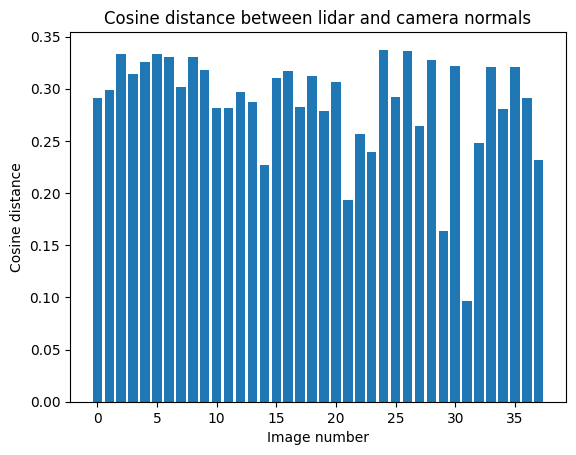

In [20]:
# plot the cosine distance as bar graph
cosine_distance = np.array(cosine_distance)
cosine_distance = cosine_distance.reshape(-1)
plt.bar(np.arange(len(cosine_distance)), cosine_distance)
plt.xlabel('Image number')
plt.ylabel('Cosine distance')
plt.title('Cosine distance between lidar and camera normals')
plt.show()

In [21]:
mean_cosine_distance = np.mean(cosine_distance)
std_cosine_distance = np.std(cosine_distance)
avg_cosine_distance = np.average(cosine_distance)
error_distance = np.sum((cosine_distance - avg_cosine_distance)**2) / len(cosine_distance)

In [22]:
print("Mean cosine distance: ", mean_cosine_distance)
print("Standard deviation of cosine distance: ", std_cosine_distance)
print("Average cosine distance: ", avg_cosine_distance)
print("Error distance (MSE): ", error_distance)

Mean cosine distance:  0.2863614261059832
Standard deviation of cosine distance:  0.05050556201956534
Average cosine distance:  0.2863614261059832
Error distance (MSE):  0.002550811794912161


#### Plotting the transformed LIDAR normals and camera normals

Lidar normal in camera:  [ 3676 -1496     1]


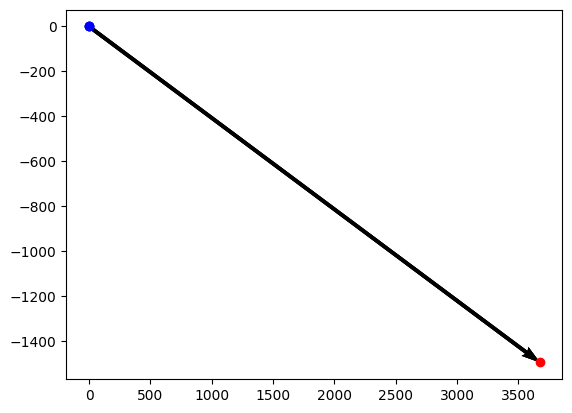

In [35]:
count = 0
for file in os.listdir('calibration/camera_images/'):
    if (count >= 5):
        break
    if file.endswith(".jpeg"):
        img = cv2.imread(os.path.join('calibration/camera_images/', file))
        # file_name : [lidar_plane_normals, lidar_plane_offsets, camera_normals, offset, rotation_vectors, translation_vectors, rotation_matrix] 
        file_name = file.split(".")[0]
        lidar_normal = data[file_name][0]
        lidar_offset = data[file_name][1]
        camera_normal = data[file_name][2]
        camera_offset = data[file_name][3]
        rotation_vector = data[file_name][4]
        translation_vector = data[file_name][5]
        rotation_matrix = data[file_name][6]
        lidar_normal_in_camera = transformation_matrix @ np.hstack((lidar_normal, 1))
        lidar_normal_in_camera = lidar_normal_in_camera[:3]
        lidar_normal_in_camera = camera_intrinsic @ lidar_normal_in_camera
        lidar_normal_in_camera = lidar_normal_in_camera / lidar_normal_in_camera[2]
        lidar_normal_in_camera = lidar_normal_in_camera.astype(np.int32)
        print("Lidar normal in camera: ", lidar_normal_in_camera)
        # lidar_normal_cam_directly = lidar_normal @ camera_intrinsic.T
        # lidar_normal_cam_directly = lidar_normal_cam_directly / lidar_normal_cam_directly[2]
        # lidar_normal_cam_directly = lidar_normal_cam_directly.astype(np.int32)
        # plot the points on the image using matplotlib and represent the points as a circle
        x, y = lidar_normal_in_camera[:2]
        origin_w = np.array([0, 0, 0])
        origin_c = rotation_matrix @ origin_w + translation_vector
        origin_c = origin_c @ camera_intrinsic.T
        origin_c = origin_c / origin_c[2]
        origin_c = origin_c.astype(np.int32)
        x_o, y_o = origin_c[:2]
        # use quiver to plot the normal vectors
        plt.quiver(x_o, y_o, x , y, angles='xy', scale_units='xy', scale=1)
        plt.scatter(x, y, color='red')
        plt.scatter(x_o, y_o, color='blue')

        # plt.imshow(img)
        break
        
    count += 1

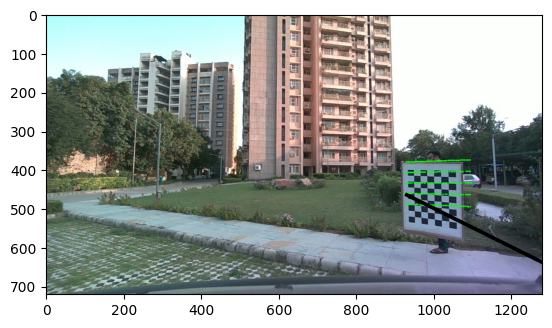

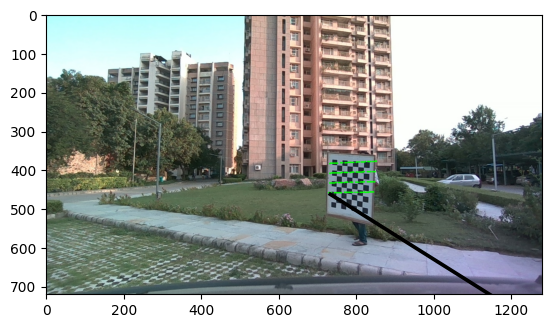

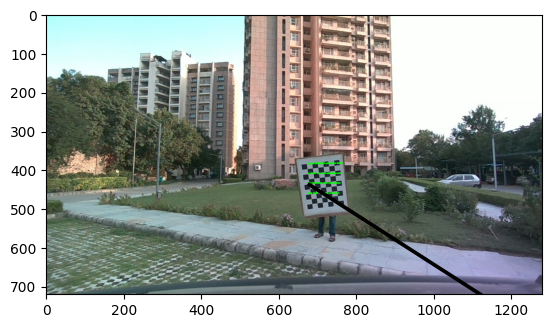

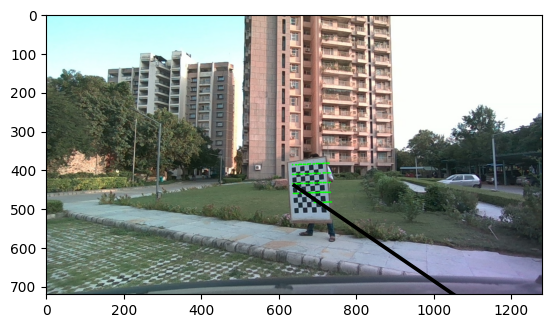

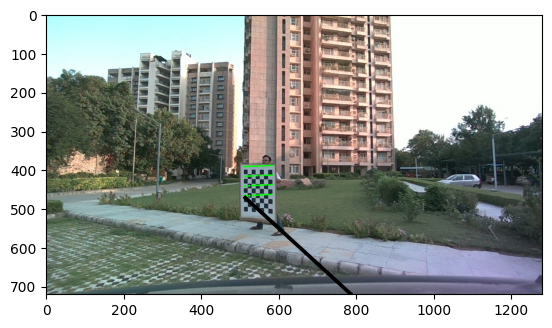

In [60]:
# fetch all the points and apply the transformation matrix
file_path = './calibration/lidar_scans/'
count = 0 
for file in os.listdir(file_path):
    if (count >= 5):
        break
    count += 1
    if file.endswith(".pcd"):
        idx = file.split('_')[1].split('.')[0]
        pcd = open3d.io.read_point_cloud('./calibration/lidar_scans/frame_' + idx + '.pcd')
        points = np.asarray(pcd.points)
        points = np.hstack((points, np.ones((points.shape[0], 1))))
        points = np.dot(transformation_matrix, points.T).T
        points = points[:, :3]
        cam_points = np.dot(points, camera_intrinsic.T)
        cam_points = cam_points / cam_points[:, 2].reshape(-1, 1)
        cam_points = cam_points.astype(np.int32)
        img = cv2.imread('calibration/camera_images/frame_' + idx + '.jpeg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        file_name = file.split(".")[0]
        lidar_normal = data[file_name][0]
        lidar_offset = data[file_name][1]
        camera_normal = data[file_name][2]
        camera_offset = data[file_name][3]
        rotation_vector = data[file_name][4]
        translation_vector = data[file_name][5]
        rotation_matrix = data[file_name][6]
        lidar_normal_in_camera = transformation_matrix @ np.hstack((lidar_normal, 1))
        lidar_normal_in_camera = lidar_normal_in_camera[:3]
        # plotting the points on the image
        max_x, max_y = np.max(cam_points[:, :2], axis=0)
        min_x, min_y = np.min(cam_points[:, :2], axis=0)
        img_height, img_width = img.shape[:2]
        canvas_height = max(max_y+10, img_height)
        canvas_width = max(max_x+10, img_width)
        canvas = np.ones((canvas_height, canvas_width, 3), dtype=np.uint8)
        canvas[:img_height, :img_width] = img
        # plot the points on the image using matplotlib and represent the points as a circle
        for i in range(cam_points.shape[0]):
            x, y = cam_points[i, :2]
            cv2.circle(canvas, (x, y), 2, (0, 255, 0), -1)
        # plotting arrows for the lidar normals
        start_point = cam_points[0, :2]
        end_point = start_point + lidar_normal_in_camera[:2]
        plt.quiver(start_point[0], start_point[1], end_point[0], end_point[1], angles='xy', scale_units='xy', scale=1) 
        plt.imshow(canvas)
        plt.show()